# Cosmological Simulation Emulator — Tutorial

This notebook builds a fast **emulator** for a suite of cosmological simulations that vary black hole feedback parameters. 

The pipeline has four stages:
1. **Load and preprocess** the simulation outputs
2. **PCA** — compress each 20-bin relation into a handful of numbers
3. **Gaussian Process** — learn how those numbers change with the input parameters
4. **MCMC** — use the emulator to infer parameters from mock observations

## 0. Setup

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pickle
from pathlib import Path
from sklearn.decomposition import PCA
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel
import emcee
import corner
import warnings

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
warnings.filterwarnings('ignore')

plt.style.use('seaborn-v0_8-whitegrid')
%matplotlib inline

DATA_DIR = Path('param_variations')
SKIP_RUN = 27  # this run crashed

## 1. Load the Simulation Data

The simulation suite spans 50 runs (one crashed, leaving 49), sampled by **Latin hypercube** over five black hole physics parameters. Each run produces the same three observables, each binned into 20 mass bins:

| Relation | x-axis | y-axis |
|---|---|---|
| SHMR | Halo mass | Stellar-to-halo mass ratio |
| Gas fractions | Halo mass | Gas fraction |
| BH–Stellar | Stellar mass | Central BH mass |

The five parameters and their prior ranges:

In [23]:
PARAM_NAMES = [
    'BlackHoleFeedbackFactor',
    'BHTorqueLimitedAccretionBondiAccretionFactor',
    'BHTorqueLimitedAccretionNormalizationFactor',
    'QuasarThreshold',
    'RadioFeedbackMinDensityFactor',
]
PRIOR_RANGES = np.array([
    [0.03,   0.3],
    [0.1,   10.0],
    [0.1,   10.0],
    [0.0006, 0.006],
    [0.002,  0.05],
])

# Load parameter samples
params_df = pd.read_csv(DATA_DIR / 'param_samples.csv', sep=';')
print('Parameter columns:', list(params_df.columns))
print(f'Total runs in CSV: {len(params_df)}')

Parameter columns: ['BlackHoleFeedbackFactor', 'BHTorqueLimitedAccretionBondiAccretionFactor', 'BHTorqueLimitedAccretionNormalizationFactor', 'QuasarThreshold', 'RadioFeedbackMinDensityFactor']
Total runs in CSV: 50


In [24]:
def load_relation(folder, filename):
    data = np.loadtxt(folder / filename)
    return data[:, 0], data[:, 1]


valid_indices = [i for i in range(len(params_df)) if i != SKIP_RUN]
N = len(valid_indices)
N_BINS = 20

shmr_data = np.full((N, N_BINS), np.nan)
gasfrac_data = np.full((N, N_BINS), np.nan)
bhstellar_data = np.full((N, N_BINS), np.nan)
theta = np.zeros((N, 5))
shmr_x = gasfrac_x = bhstellar_x = None

for arr_idx, run_idx in enumerate(valid_indices):
    folder = DATA_DIR / f'param_variation_{run_idx}'
    x, y = load_relation(folder, 'shmr.txt')
    shmr_x = np.log10(x)
    shmr_data[arr_idx] = y

    x, y = load_relation(folder, 'gasfractions.txt')
    gasfrac_x = np.log10(x)
    gasfrac_data[arr_idx] = y

    x, y = load_relation(folder, 'bhstellar.txt')
    bhstellar_x = np.log10(x)
    bhstellar_data[arr_idx] = np.log10(np.where(y > 0, y, np.nan))

    theta[arr_idx] = params_df.iloc[run_idx].values

print(f'Loaded {N} simulations')
print(f'theta shape: {theta.shape}')
print(f'shmr_data shape: {shmr_data.shape}')

Loaded 49 simulations
theta shape: (49, 5)
shmr_data shape: (49, 20)


### Quick look at the data

Before doing any modelling, always plot the raw outputs. The spread across simulations tells you how much the parameters matter, and whether there are outliers or non-physical values.

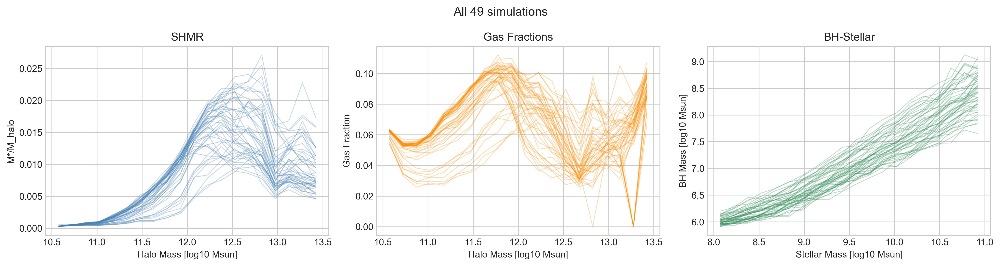

In [25]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for i in range(N):
    axes[0].plot(shmr_x, shmr_data[i], color='steelblue', alpha=0.3, lw=0.8)
    axes[1].plot(gasfrac_x, gasfrac_data[i],
                 color='darkorange', alpha=0.3, lw=0.8)
    axes[2].plot(bhstellar_x, bhstellar_data[i],
                 color='seagreen', alpha=0.3, lw=0.8)

axes[0].set(xlabel='Halo Mass [log10 Msun]', ylabel='M*/M_halo', title='SHMR')
axes[1].set(xlabel='Halo Mass [log10 Msun]',
            ylabel='Gas Fraction', title='Gas Fractions')
axes[2].set(xlabel='Stellar Mass [log10 Msun]',
            ylabel='BH Mass [log10 Msun]', title='BH-Stellar')
fig.suptitle('All 49 simulations', fontsize=13)
plt.tight_layout()

## 2. Preprocessing

Two things to do before fitting any model:

**Log-transform the BH mass.** The BH–stellar relation spans orders of magnitude in BH mass. Working in log space makes the relation closer to linear and variance more homogeneous across bins.

**Normalise the parameters to [0, 1].** The five parameters have very different units and scales. Gaussian Processes use a distance metric in parameter space — if one parameter spans `[0.03, 0.3]` and another spans `[0.1, 10]`, the GP will treat them as having wildly different importance unless we normalise first.

In [26]:
def normalize_theta(theta):
    """Map each parameter linearly to [0, 1] using its prior range."""
    return (theta - PRIOR_RANGES[:, 0]) / (PRIOR_RANGES[:, 1] - PRIOR_RANGES[:, 0])


theta_norm = normalize_theta(theta)
print('Normalised theta — min/max per column:')
print(np.column_stack([theta_norm.min(axis=0), theta_norm.max(axis=0)]))

Normalised theta — min/max per column:
[[2.22222222e-03 9.84296296e-01]
 [3.53535354e-05 9.60750505e-01]
 [1.78787879e-04 9.43655556e-01]
 [3.70370370e-03 9.96296296e-01]
 [1.04166667e-03 9.80208333e-01]]


## 3. Dimensionality Reduction with PCA

Each simulation produces a 20-bin relation. We can't fit a GP on a 20-dimensional output directly — there would be too many free parameters and GPs scale poorly with output dimension.

Instead, we use **Principal Component Analysis (PCA)** to find a low-dimensional summary.

**Intuition:** Imagine plotting all 49 SHMR curves on top of each other. Most of the variation between curves is captured by a small number of "modes" — one mode that shifts the overall amplitude, another that tilts the slope, etc. PCA finds these modes automatically. We keep only the first `k` modes, projecting each 20-bin curve down to `k` numbers (its PC scores).

The key question is: **how many modes (k) do we need?** Too few, and we lose information. Too many, and we're fitting noise — each additional mode is harder for the GP to learn from only 49 training points.

We use two criteria to choose k:
1. Cumulative **explained variance ≥ 95%** — the k modes account for at least 95% of the variation across simulations
2. Leave-one-out (LOO) reconstruction **RMSE < 5% of the data's standard deviation** — adding more modes is no longer meaningfully improving reconstruction of held-out simulations

We take the larger of the two k values so both conditions are satisfied.

In [27]:
# ── Hardcoded k values — feel free to change these ──────────────────────────
K_SHMR = 9
K_GASFRAC = 10
K_BHSTELLAR = 5
# ────────────────────────────────────────────────────────────────────────────

RELATIONS = {
    'shmr':      {'data': shmr_data,      'x': shmr_x,      'k': K_SHMR,      'label': 'SHMR'},
    'gasfrac':   {'data': gasfrac_data,   'x': gasfrac_x,   'k': K_GASFRAC,   'label': 'Gas Fractions'},
    'bhstellar': {'data': bhstellar_data, 'x': bhstellar_x, 'k': K_BHSTELLAR, 'label': 'BH-Stellar'},
}

Computing LOO for shmr...
Computing LOO for gasfrac...
Computing LOO for bhstellar...


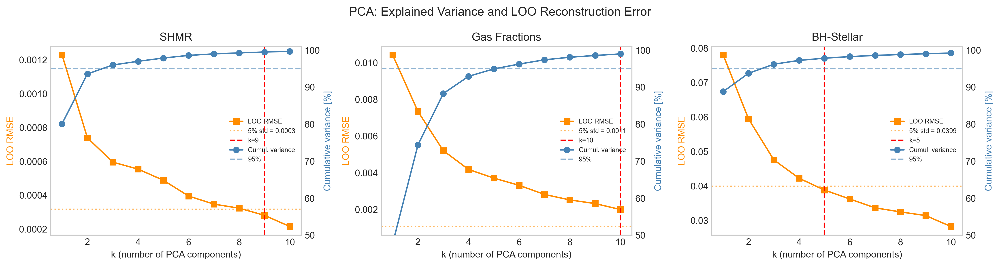

In [28]:
def loo_rmse(data, k):
    """Mean LOO reconstruction RMSE for k-component PCA."""
    rmses = []
    for i in range(len(data)):
        train = np.delete(data, i, axis=0)
        pca = PCA(n_components=k).fit(train)
        recon = pca.inverse_transform(pca.transform(data[i:i+1]))[0]
        rmses.append(np.sqrt(np.mean((recon - data[i])**2)))
    return np.mean(rmses)


fig, axes = plt.subplots(1, 3, figsize=(15, 4))
MAX_K = 10

for ax, (rel_key, rel) in zip(axes, RELATIONS.items()):
    data = rel['data']
    data_std = np.std(data)
    threshold = 0.05 * data_std

    # Full PCA for explained variance
    pca_full = PCA(n_components=None).fit(data)
    cum_var = np.cumsum(pca_full.explained_variance_ratio_) * 100

    # LOO RMSE curve
    print(f'Computing LOO for {rel_key}...')
    ks = np.arange(1, MAX_K + 1)
    rmses = [loo_rmse(data, k) for k in ks]

    ax2 = ax.twinx()
    ax.plot(ks, rmses, 's-', color='darkorange', label='LOO RMSE')
    ax.axhline(threshold, color='darkorange', linestyle=':',
               alpha=0.6, label=f'5% std = {threshold:.4f}')
    ax2.plot(ks, cum_var[:MAX_K], 'o-',
             color='steelblue', label='Cumul. variance')
    ax2.axhline(95, color='steelblue', linestyle='--', alpha=0.6, label='95%')
    ax.axvline(rel['k'], color='red', linestyle='--', label=f"k={rel['k']}")

    ax.set_xlabel('k (number of PCA components)')
    ax.set_ylabel('LOO RMSE', color='darkorange')
    ax2.set_ylabel('Cumulative variance [%]', color='steelblue')
    ax2.set_ylim(50, 101)
    ax.set_title(rel['label'])
    lines1, labels1 = ax.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax.legend(lines1 + lines2, labels1 + labels2,
              fontsize=7, loc='center right')
    ax.grid(False)
    ax2.grid(False)

fig.suptitle(
    'PCA: Explained Variance and LOO Reconstruction Error', fontsize=13)
plt.tight_layout()

### What are the PC modes?

The PC modes (eigenvectors) show *which shape changes* each component captures. PC1 is the most common mode of variation across simulations, PC2 the second most common, and so on.

For the SHMR: PC1 is a smooth positive-definite mode peaking near the characteristic halo mass — it encodes the overall normalisation. PC2 has a sign change, encoding a pivot or shift in the peak position.

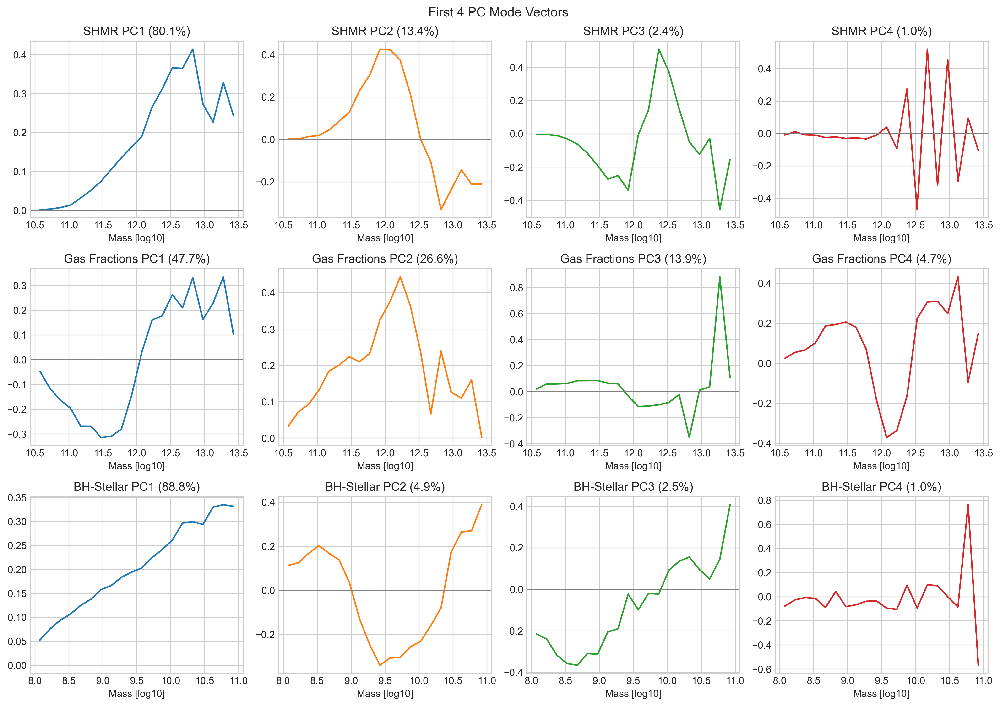

In [29]:
fig, axes = plt.subplots(3, 4, figsize=(14, 10))

for row, (rel_key, rel) in enumerate(RELATIONS.items()):
    pca = PCA(n_components=4).fit(rel['data'])
    pca_full = PCA(n_components=None).fit(rel['data'])
    var_ratios = pca_full.explained_variance_ratio_
    for j in range(4):
        ax = axes[row, j]
        ax.plot(rel['x'], pca.components_[j], color=f'C{j}', lw=1.5)
        ax.axhline(0, color='gray', lw=0.5)
        ax.set_title(f"{rel['label']} PC{j+1} ({var_ratios[j]*100:.1f}%)")
        ax.set_xlabel('Mass [log10]')

plt.suptitle('First 4 PC Mode Vectors', fontsize=13)
plt.tight_layout()

## 4. Gaussian Process Emulator

Now we have a compact representation: each simulation is described by `k` PC scores per relation. The emulator's job is to **predict those scores for any parameter vector**, even ones that were never simulated.

We use a **Gaussian Process (GP)** for this. A GP is a probabilistic interpolation model. Think of it as fitting a smooth surface through your training points, while tracking how uncertain it is everywhere — the uncertainty grows as you move away from training data.

Formally, a GP assumes the output values at different inputs are jointly Gaussian, with a covariance structure defined by a **kernel function**. We use:
- **RBF (Radial Basis Function) kernel** — nearby points in parameter space should have similar PC scores. The length scale controls how far "nearby" extends.
- **White noise kernel** — accounts for noise/irreducible scatter in the PC scores.

We fit **one GP per PC component per relation** (k × 3 GPs total). Each GP takes the 5D normalised parameter vector as input and outputs a predicted PC score plus uncertainty.

To reconstruct the full relation from predicted PC scores:
- **Mean:** `pca.inverse_transform(predicted_scores)`
- **Variance per bin:** `Σ_j (GP_variance_j × PC_component_j²)` — uncertainty in each PC propagates through the PCA basis vectors

In [30]:
def fit_emulator(data, theta_norm, k):
    """Fit PCA + k GPs. Returns (fitted_pca, list_of_gps)."""
    pca = PCA(n_components=k).fit(data)
    scores = pca.transform(data)  # shape [N, k]
    gps = []
    for j in range(k):
        kernel = RBF(length_scale_bounds=(1e-2, 1e2)) + WhiteKernel()
        gp = GaussianProcessRegressor(
            kernel=kernel, normalize_y=True, n_restarts_optimizer=3)
        gp.fit(theta_norm, scores[:, j])
        gps.append(gp)
    return pca, gps


def predict(pca, gps, theta_norm_single):
    """Predict relation mean and per-bin variance for one parameter vector."""
    k = len(gps)
    mu_z, var_z = np.zeros(k), np.zeros(k)
    for j, gp in enumerate(gps):
        m, s = gp.predict(theta_norm_single.reshape(1, -1), return_std=True)
        mu_z[j], var_z[j] = m[0], s[0]**2
    mu_rel = pca.inverse_transform(mu_z.reshape(1, -1))[0]
    # Uncertainty propagation: each PC contributes var_z[j] * component[j]^2 per bin
    var_rel = np.sum(var_z[:, None] * pca.components_**2, axis=0)
    return mu_rel, var_rel


# Fit emulators on all training data
emulators = {}
for rel_key, rel in RELATIONS.items():
    print(f'Fitting emulator for {rel_key} (k={rel["k"]})...')
    pca, gps = fit_emulator(rel['data'], theta_norm, rel['k'])
    emulators[rel_key] = {'pca': pca, 'gps': gps}
print('Done.')

Fitting emulator for shmr (k=9)...
Fitting emulator for gasfrac (k=10)...
Fitting emulator for bhstellar (k=5)...
Done.


### Validation: Leave-One-Out Cross-Validation

To test how well the emulator generalises, we use **leave-one-out (LOO) cross-validation**: for each simulation, we retrain the emulator on the other 48, then predict the held-out one. This gives an unbiased estimate of emulator error on new simulations.

Note: we refit *both* the PCA and the GPs on the 48 training sims. If we used the full-dataset PCA basis, we would leak information about the held-out simulation into the basis.

LOO for shmr...
LOO for gasfrac...
LOO for bhstellar...


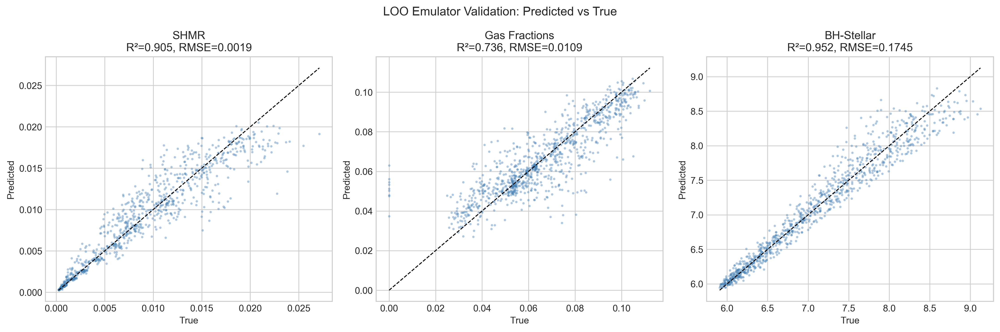

In [31]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

for ax, (rel_key, rel) in zip(axes, RELATIONS.items()):
    data = rel['data']
    k = rel['k']
    all_pred = np.zeros_like(data)

    print(f'LOO for {rel_key}...')
    for i in range(N):
        train_data = np.delete(data, i, axis=0)
        train_theta = np.delete(theta_norm, i, axis=0)
        pca_loo, gps_loo = fit_emulator(train_data, train_theta, k)
        mu_pred, _ = predict(pca_loo, gps_loo, theta_norm[i])
        all_pred[i] = mu_pred

    r2 = 1 - np.sum((all_pred - data)**2) / np.sum((data - data.mean())**2)
    rmse = np.sqrt(np.mean((all_pred - data)**2))

    ax.scatter(data.ravel(), all_pred.ravel(),
               s=3, alpha=0.3, color='steelblue')
    lims = [min(data.min(), all_pred.min()), max(data.max(), all_pred.max())]
    ax.plot(lims, lims, 'k--', lw=1)
    ax.set_xlabel('True')
    ax.set_ylabel('Predicted')
    ax.set_title(f"{rel['label']}\nR²={r2:.3f}, RMSE={rmse:.4f}")

plt.suptitle('LOO Emulator Validation: Predicted vs True', fontsize=13)
plt.tight_layout()

## 5. One-Parameter Variation Plots

Now we use the emulator to explore how each parameter affects each relation, holding the other four at their median values. This is sometimes called a **1P (one-parameter) sweep**.

We show 7 values per parameter, each as a separate curve with its own **±1σ uncertainty band** from the GP. The band width tells you how confident the emulator is at that point in parameter space — it grows where the training data is sparse.

This is something you couldn't easily do with the raw simulations: the emulator lets you query arbitrary parameter values continuously.

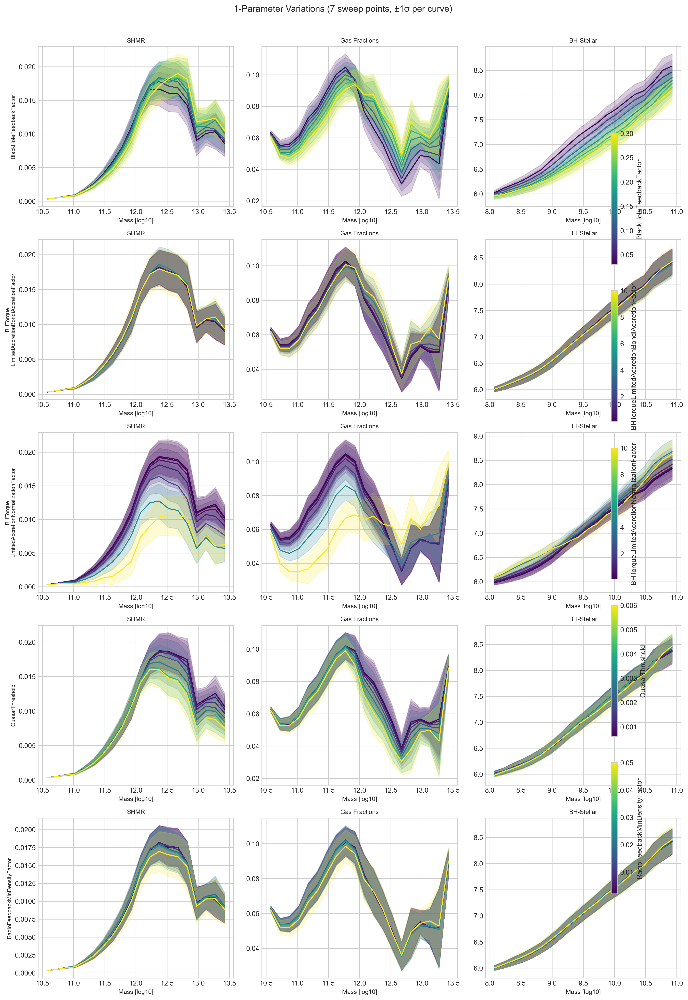

In [32]:
theta_median = np.median(theta, axis=0)
LOG_SPACED = {1, 2, 3, 4}  # parameters best varied on log scale
N_SWEEP = 7

fig, axes = plt.subplots(
    len(PARAM_NAMES), 3, figsize=(14, 4 * len(PARAM_NAMES)))

for p_idx, p_name in enumerate(PARAM_NAMES):
    lo, hi = PRIOR_RANGES[p_idx]
    sweep_vals = (np.logspace(np.log10(lo), np.log10(hi), N_SWEEP)
                  if p_idx in LOG_SPACED else np.linspace(lo, hi, N_SWEEP))

    cmap = cm.viridis
    norm_color = plt.Normalize(sweep_vals.min(), sweep_vals.max())

    for col, (rel_key, rel) in enumerate(RELATIONS.items()):
        ax = axes[p_idx, col]
        pca = emulators[rel_key]['pca']
        gps = emulators[rel_key]['gps']
        x = rel['x']

        for val in sweep_vals:
            theta_test = theta_median.copy()
            theta_test[p_idx] = val
            mu, var = predict(pca, gps, normalize_theta(theta_test))
            sigma = np.sqrt(var)
            color = cmap(norm_color(val))
            ax.plot(x, mu, color=color, lw=1.5)
            ax.fill_between(x, mu - sigma, mu + sigma, color=color, alpha=0.2)

        ax.set_xlabel('Mass [log10]', fontsize=9)
        ax.set_title(rel['label'], fontsize=9)
        if col == 0:
            ax.set_ylabel(p_name.replace('BHTorque', 'BHTorque\n'), fontsize=8)

    # Shared colorbar per row
    sm = cm.ScalarMappable(cmap=cmap, norm=norm_color)
    sm.set_array([])
    fig.colorbar(sm, ax=axes[p_idx, :], fraction=0.015, pad=0.04, label=p_name)

plt.suptitle(
    '1-Parameter Variations (7 sweep points, ±1σ per curve)', fontsize=13, y=1.01)
plt.tight_layout()

## 6. MCMC Parameter Inference

Now we use the emulator to **infer parameter values from observations**. We pick one simulation as a mock observation (pretending we don't know its parameters), then use MCMC to recover them.

### Leave-one-out emulator refitting

A key subtlety: the GP has near-zero variance at training points, which would produce artificially overconfident posteriors. To get honest uncertainty estimates, we **refit the emulator on N−1 simulations**, excluding the mock before running MCMC. This way the GP's predictive variance at the test point reflects genuine interpolation uncertainty.

### Likelihood formulations

Two formulations are compared:

**Data-space likelihood:** GP variance is propagated back through the PCA inverse transform, giving per-bin variances σ²_pred. The log-likelihood is:

$$\log \mathcal{L} = -\frac{1}{2} \sum_{\text{bins}} \frac{(y_{\text{obs}} - \mu_{\text{pred}})^2}{\sigma^2_{\text{pred}}}$$

**PC-space likelihood:** The observation is projected into PC score space using the LOO PCA, and the likelihood is evaluated in k dimensions directly:

$$\log \mathcal{L} = -\frac{1}{2} \sum_{j=1}^{k} \frac{(z_{\text{obs},j} - \mu_{z,j})^2}{\sigma^2_{z,j}} - \frac{1}{2} \sum_{j=1}^{k} \log \sigma^2_{z,j}$$

The log-det term (second sum) penalizes uncertain regions of parameter space, making the PC-space formulation more conservative. No observational noise is assumed — these are exact simulation outputs.

We illustrate the data-space formulation below. We sum log-likelihoods over all three relations, assuming independence between them.

### Prior

Flat (uniform) prior within the prior ranges; −∞ outside.

### Sampler

We use `emcee`, an affine-invariant ensemble sampler. It runs many "walkers" simultaneously, each proposing new positions by combining others. No gradient information is needed — only evaluations of log(posterior). With the emulator, each evaluation takes milliseconds.

In [33]:
from sklearn.decomposition import PCA
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel

# Pick mock observation: simulation closest to median parameters
theta_norm_median = np.median(theta_norm, axis=0)
mock_idx = int(np.argmin(np.linalg.norm(
    theta_norm - theta_norm_median, axis=1)))
true_theta = theta[mock_idx]
print(f'Mock observation: simulation {mock_idx}')
for name, val in zip(PARAM_NAMES, true_theta):
    print(f'  {name}: {val:.5f}')

# LOO: refit PCA + GPs excluding the mock
print('\nRefitting LOO emulator (excluding mock)...')
loo_emulators = {}
for rel_key, rel in RELATIONS.items():
    k = rel['k']
    data_valid = rel['data']  # already masked to valid bins
    train_data = np.delete(data_valid, mock_idx, axis=0)
    train_theta = np.delete(theta_norm,  mock_idx, axis=0)
    pca = PCA(n_components=k)
    scores = pca.fit_transform(train_data)
    gps = []
    for j in range(k):
        gp = GaussianProcessRegressor(
            kernel=RBF(length_scale_bounds=(1e-2, 1e2)) + WhiteKernel(),
            normalize_y=True, n_restarts_optimizer=5,
        )
        gp.fit(train_theta, scores[:, j])
        gps.append(gp)
    loo_emulators[rel_key] = {'pca': pca, 'gps': gps, 'k': k}

# Observation in data space (valid bins)
obs_data = {rel_key: rel['data'][mock_idx]
            for rel_key, rel in RELATIONS.items()}


def log_prior(theta_prop):
    if np.all(theta_prop >= PRIOR_RANGES[:, 0]) and np.all(theta_prop <= PRIOR_RANGES[:, 1]):
        return 0.0
    return -np.inf


def log_likelihood(theta_prop, obs_data):
    """Data-space likelihood; noise = GP variance only (exact simulation outputs)."""
    theta_n = normalize_theta(theta_prop)
    log_L = 0.0
    for rel_key, rel in RELATIONS.items():
        pca = loo_emulators[rel_key]['pca']
        gps = loo_emulators[rel_key]['gps']
        mu_pred, var_pred = predict(pca, gps, theta_n)
        log_L += -0.5 * \
            np.sum((obs_data[rel_key] - mu_pred)**2 / (var_pred + 1e-12))
    return log_L


def log_posterior(theta_prop, obs_data):
    lp = log_prior(theta_prop)
    return lp + log_likelihood(theta_prop, obs_data) if np.isfinite(lp) else -np.inf

Mock observation: simulation 44
  BlackHoleFeedbackFactor: 0.11318
  BHTorqueLimitedAccretionBondiAccretionFactor: 0.70060
  BHTorqueLimitedAccretionNormalizationFactor: 0.64431
  QuasarThreshold: 0.00163
  RadioFeedbackMinDensityFactor: 0.00441

Refitting LOO emulator (excluding mock)...


In [34]:
N_WALKERS = 32
N_STEPS = 3000
N_BURN = 1000

# Initialise walkers in a tight ball around the true parameters (1% of prior range)
prior_width = PRIOR_RANGES[:, 1] - PRIOR_RANGES[:, 0]
p0 = true_theta + 0.01 * prior_width * np.random.randn(N_WALKERS, 5)
p0 = np.clip(p0, PRIOR_RANGES[:, 0], PRIOR_RANGES[:, 1])

sampler = emcee.EnsembleSampler(N_WALKERS, 5, log_posterior, args=[obs_data])
print(f'Running {N_STEPS} steps with {N_WALKERS} walkers...')
sampler.run_mcmc(p0, N_STEPS, progress=True)

acc = np.mean(sampler.acceptance_fraction)
print(f'Acceptance fraction: {acc:.3f}', '(healthy: 0.2–0.5)' if 0.2 <=
      acc <= 0.5 else '⚠ outside healthy range')

flat_samples = sampler.get_chain(discard=N_BURN, flat=True)
print(f'Posterior samples: {flat_samples.shape}')

Running 3000 steps with 32 walkers...


100%|██████████| 3000/3000 [01:32<00:00, 32.57it/s]

Acceptance fraction: 0.361 (healthy: 0.2–0.5)
Posterior samples: (64000, 5)


Text(0.5, 1.01, 'Posterior for mock observation (simulation 44)')

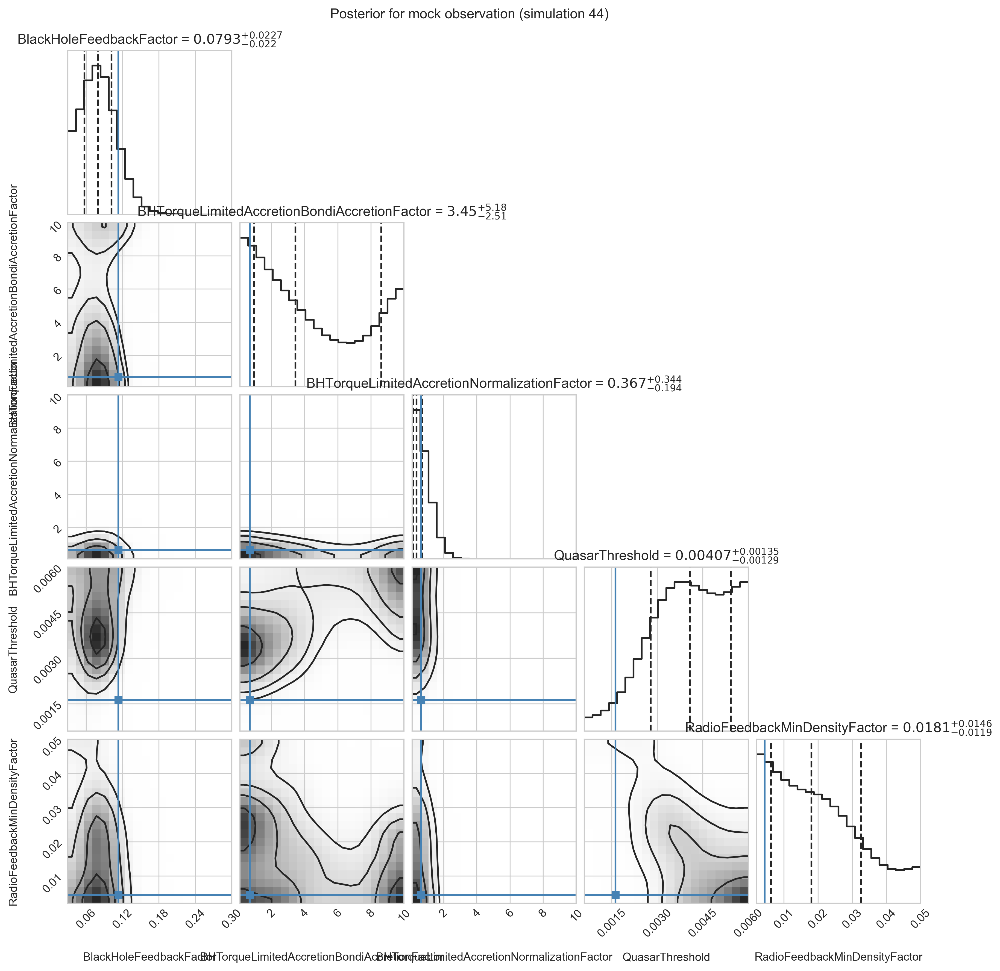

In [35]:
fig = corner.corner(
    flat_samples,
    labels=PARAM_NAMES,
    truths=true_theta,
    quantiles=[0.16, 0.5, 0.84],
    show_titles=True,
    title_fmt='.3g',
    plot_datapoints=False,
    range=list(map(tuple, PRIOR_RANGES)),
    smooth=1.5,
    smooth1d=1.5,
)
fig.suptitle(
    f'Posterior for mock observation (simulation {mock_idx})', fontsize=12, y=1.01)

### Reading the corner plot

- **Diagonal panels** show the 1D marginal posterior for each parameter. The dashed lines mark the 16th, 50th, and 84th percentiles (median ±1σ). The blue dashed line is the true value.
- **Off-diagonal panels** show 2D joint posteriors (contours). Elongated or tilted contours indicate degeneracies between parameters.
- The **axis limits are the prior boundaries** — a posterior that spans the full axis is prior-dominated (the data give little information about that parameter).

Parameters with wide, flat posteriors (e.g. BondiAccretionFactor, RadioFeedbackMinDensityFactor) have little effect on the three observables — the emulator cannot constrain them from these summary statistics alone.

## Summary

| Step | Method | Key output |
|---|---|---|
| Compression | PCA | k PC scores per simulation |
| Emulation | Gaussian Process | Predicted scores + uncertainty at any θ |
| Validation | LOO cross-validation | R², RMSE per relation |
| Exploration | 1P sweeps | Which parameters matter and where |
| Inference | MCMC (emcee) | Posterior distribution over parameters |

**Things to improve:**
- More training simulations → better GP coverage, narrower posteriors
- Account for bin–bin and relation–relation covariance in the likelihood (not assumed independent)
- Use log-space for parameters that span orders of magnitude in the GP kernel
- Try nonlinear compression (e.g. an autoencoder) if PCA requires many components